In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pylab as plt
import cv2
from matplotlib import image
import os
import numpy as np
from scipy import ndimage
from scipy.ndimage import morphology
import mach_functions


pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html


In [2]:
Image = cv2.imread('./TestImages/n2018-07-28-1787-S3.png')

In [3]:
cleandImage = mach_functions.cleanImage(Image)

In [4]:
rgbImage = cv2.cvtColor(cleandImage,cv2.COLOR_BGR2RGB)

In [5]:
grayImage = mach_functions.invertGrayImage(cleandImage)

In [6]:
yamlFile = "Params.yaml"
Params = mach_functions.load_yaml(yamlFile)
Filters = mach_functions.readInfilters(Params)

In [7]:
ttimage = grayImage[1000:2000,1000:2000]

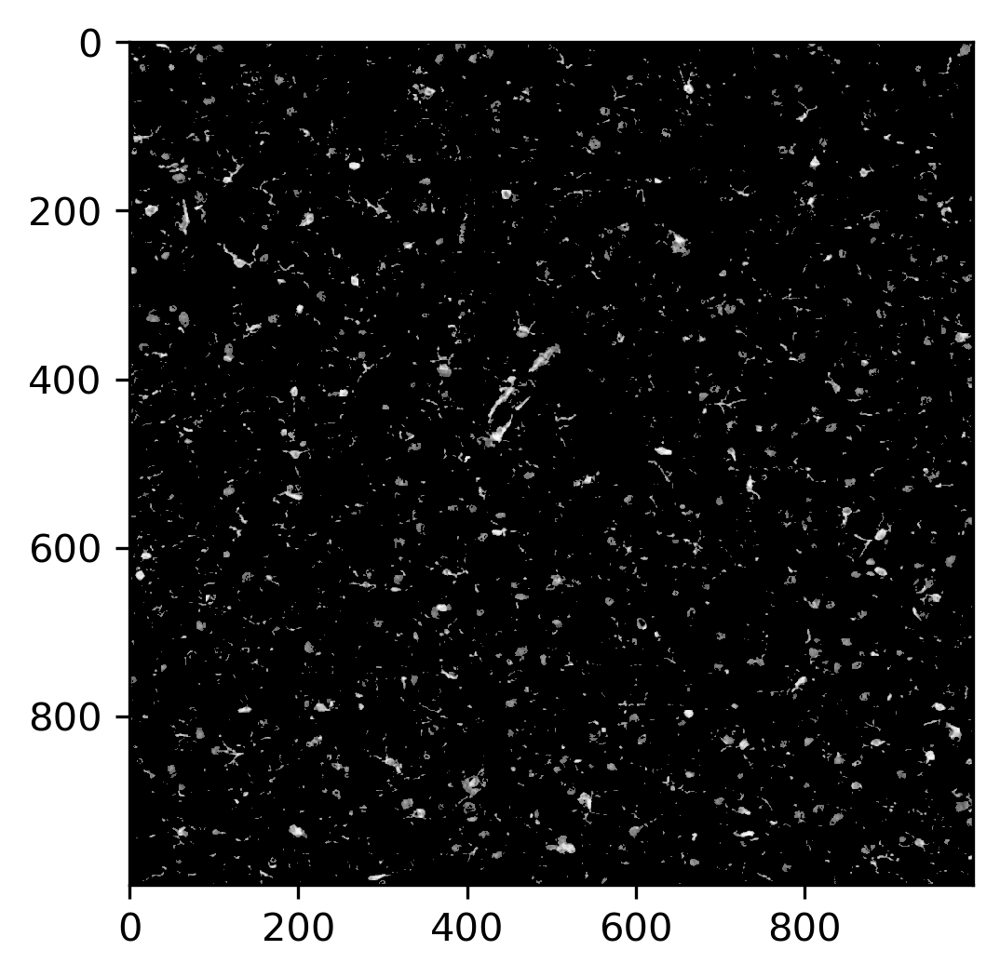

In [8]:
plt.figure(dpi=300)
plt.imshow(ttimage,cmap='gray')

In [9]:
detectedrodcells, Crplanes = mach_functions.giveRod(ttimage,Filters['NormalFilters']['rod'],Filters['PenaltyFilters']['rrodp'],\
                                                    snrthres=0.27,fragRodRefine=False,areaRefine=False)

In [10]:
fragrodcells, Crplanes2 = mach_functions.giveRod(ttimage,Filters['NormalFilters']['rod'],Filters['PenaltyFilters']['rrodp'],\
                                                    snrthres=0.27,fragRodRefine=True,\
                                                        somaFilter=Filters['NormalFilters']['amoe'],
                                                        somathres=0.33,areaRefine=False
                                                        )

In [17]:
fragandarearodcells, Crplanes3 = mach_functions.giveRod(ttimage,Filters['NormalFilters']['rod'],Filters['PenaltyFilters']['rrodp'],\
                                                    snrthres=0.27,fragRodRefine=True,\
                                                        somaFilter=Filters['NormalFilters']['amoe'],
                                                        somathres=0.33,areaRefine=True,\
                                                        areathres=0.03
                                                        )

In [18]:
colorImage = mach_functions.pasteImage(Image[1000:2000,1000:2000],detectedrodcells,'red')
ncolorImage = mach_functions.pasteImage(Image[1000:2000,1000:2000],fragrodcells,'red')
nncolorImage = mach_functions.pasteImage(Image[1000:2000,1000:2000],fragandarearodcells,'red')


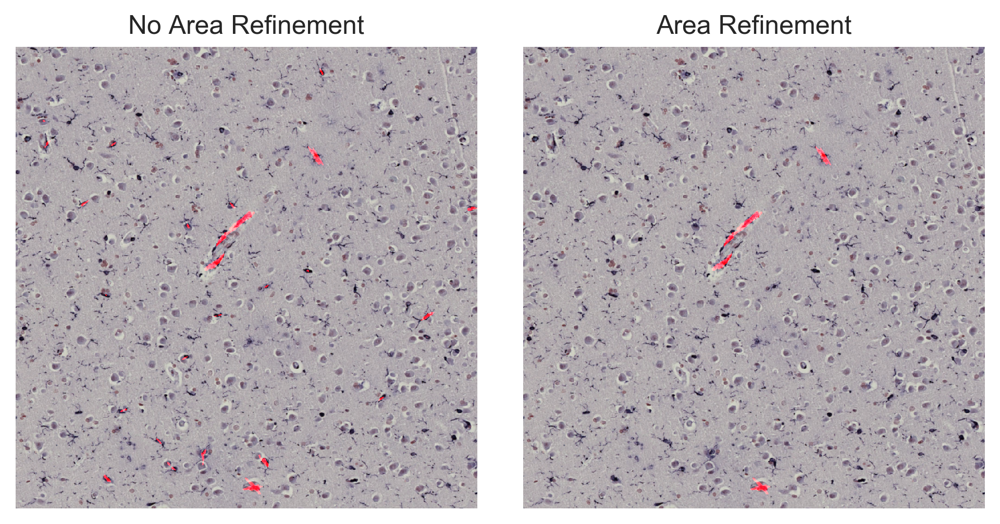

In [22]:
plt.style.use('seaborn')
plt.figure(dpi=300)

#plt.subplot(1,2,1)
#plt.imshow(Image[1000:2000,1000:2000])
#plt.xticks([])
#plt.yticks([])
plt.subplot(1,2,1)
plt.title('No Area Refinement')
plt.imshow(ncolorImage)
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(nncolorImage)
plt.title('Area Refinement')
plt.xticks([])
plt.yticks([])
plt.subplots_adjust(hspace=0,wspace=0.1)
plt.savefig('rod.png')




In [8]:
cImage = mach_functions.pasteImage(Image[1000:2000,1000:2000],detectedrodcells,'red')

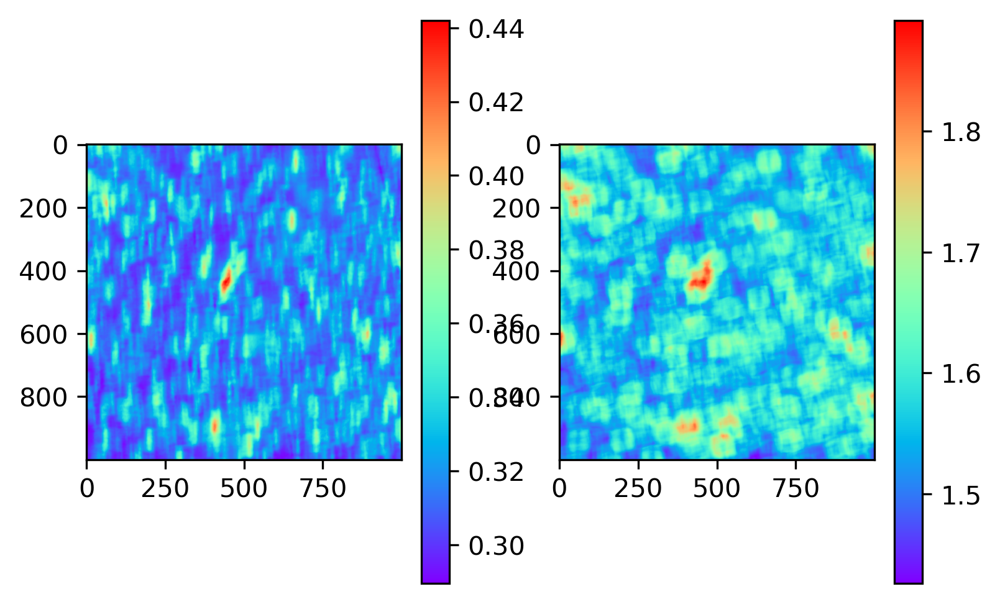

In [13]:
plt.figure(dpi=300)
plt.subplot(1,2,1)
plt.imshow(Crplanes[20][0],cmap='rainbow')
plt.colorbar()
plt.subplot(1,2,2)
plt.imshow(Crplanes[20][1],cmap='rainbow')
plt.colorbar()

In [16]:
oriImage = Image[1000:2000,1000:2000]
goriImage = mach_functions.addGrid(oriImage)
gcImage = mach_functions.addGrid(cImage)

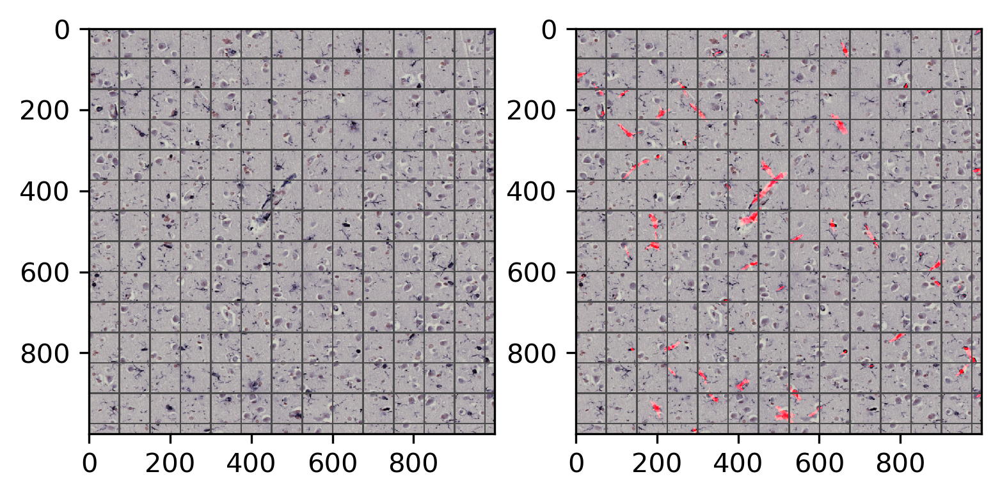

In [17]:
plt.figure(dpi=300)
plt.subplot(1,2,1)
plt.imshow(goriImage)

plt.subplot(1,2,2)
plt.imshow(gcImage)

In [41]:
results = runFiltering("./Params.yaml")


using the 'rrodp' as penalty filter for rod cell detection
Detecting the rod cells ---
Detecting the ram/hyp cells ---
Detecting the amoe/dys cells ---


get the performace score defined as $f = \sum W_{TP,i} (1-TP_i) + W_{FP,i}FP_i$ and save the TP/FP into a figure

rod
ram
hyp
amoe
dys


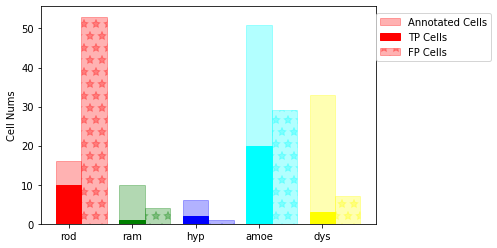

In [42]:
results.resetTPFPWeights()
results.calculateTPFP()
PFscore = results.calculatePFscore()
results.plotTPFPfigure("TPFP.png")

In [43]:
print (PFscore)

8.118516042780747
